# Project 2
## Keeno Glanville
### Network Analysis of Character Subclass vs character Location on World of War Craft
dataset foudn through kaggle (https://www.kaggle.com/datasets/mylesoneill/warcraft-avatar-history?select=wowah_data.csv)
![Example Image](https://th.bing.com/th/id/R.917273cbb50dde3ab0e8e38e16520b5b?rik=oUqetcEQ0u%2bc0A&riu=http%3a%2f%2forig00.deviantart.net%2f65b8%2ff%2f2014%2f205%2f9%2f0%2fworld_of_warcraft___guild_painting_by_tsylore-d7qsijd.jpg&ehk=KWnKRxo5SqWjIJxxzIeXdw7yZmitK1s%2bfzLZfcLKRlw%3d&risl=&pid=ImgRaw&r=0)

In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import math
import networkx.algorithms.bipartite as bipartite

In [2]:
data = pd.read_csv('wowah_data.csv')
 

In [3]:
data.columns = data.columns.str.strip()
data.head(10)

,char,level,race,charclass,zone,guild,timestamp
0,59425,1,Orc,Rogue,Orgrimmar,165,01/01/08 00:02:04
1,65494,9,Orc,Hunter,Durotar,-1,01/01/08 00:02:04
2,65325,14,Orc,Warrior,Ghostlands,-1,01/01/08 00:02:04
3,65490,18,Orc,Hunter,Ghostlands,-1,01/01/08 00:02:04
4,2288,60,Orc,Hunter,Hellfire Peninsula,-1,01/01/08 00:02:09
5,2289,60,Orc,Hunter,Hellfire Peninsula,-1,01/01/08 00:02:09
6,61239,68,Orc,Hunter,Blade's Edge Mountains,243,01/01/08 00:02:14
7,59772,69,Orc,Warrior,Shadowmoon Valley,35,01/01/08 00:02:14
8,22937,69,Orc,Rogue,Warsong Gulch,243,01/01/08 00:02:14
9,23062,69,Orc,Shaman,Shattrath City,103,01/01/08 00:02:14


In [4]:
data.columns

Index(['char', 'level', 'race', 'charclass', 'zone', 'guild', 'timestamp'], dtype='object')

In [5]:
data['charclass'].unique()

array(['Rogue', 'Hunter', 'Warrior', 'Shaman', 'Warlock', 'Druid',
       'Priest', 'Mage', 'Paladin', 'Death Knight'], dtype=object)

In [6]:
data['zone'].unique()

array(['Orgrimmar', 'Durotar', 'Ghostlands', 'Hellfire Peninsula',
       "Blade's Edge Mountains", 'Shadowmoon Valley', 'Warsong Gulch',
       'Shattrath City', 'Sethekk Halls', 'Undercity', 'Tirisfal Glades',
       'Terokkar Forest', 'Netherstorm', 'Auchenai Crypts',
       'Eye of the Storm', "Zul'Farrak", 'The Steamvault', 'The Mechanar',
       'Alterac Valley', 'Tanaris', 'Hillsbrad Foothills', 'Ashenvale',
       'Stranglethorn Vale', 'Mulgore', 'The Barrens', 'Winterspring',
       'Silithus', 'Feralas', 'Zangarmarsh', 'Thunder Bluff',
       'Blasted Lands', 'Arathi Basin', 'The Arcatraz', 'The Botanica',
       'Silverpine Forest', 'Stonetalon Mountains', 'Western Plaguelands',
       'Felwood', 'Nagrand', 'The Underbog', 'The Shattered Halls',
       'Swamp of Sorrows', 'Badlands', 'The Hinterlands',
       "Un'Goro Crater", 'Blackfathom Deeps', 'Nagrand Arena',
       'Mana-Tombs', 'Searing Gorge', 'Eversong Woods', 'Silvermoon City',
       'Elwynn Forest', 'Arathi Highl

In [7]:
data['level'].unique()

array([ 1,  9, 14, 18, 60, 68, 69, 70, 48, 28, 44, 49, 26, 34, 35,  4, 13,
       17, 19, 57, 54, 59, 56, 64, 53, 63, 67, 24, 32, 15,  6,  7, 50, 43,
       46, 23, 61, 52, 58, 62, 66, 65, 11, 20, 25, 30, 21, 22, 29, 27, 33,
       31, 39, 38, 40, 36, 42, 41, 51, 55, 10,  5, 16, 12,  8, 45,  2, 37,
        3, 47, 71, 73, 72, 74, 75, 76, 77, 78, 79, 80], dtype=int64)

In [8]:
G = nx.Graph()
edges = data[['charclass', 'zone', 'level']]
edgelist = np.array(edges)
G.add_weighted_edges_from(edgelist)

In [9]:
print(G.nodes())

['Rogue', 'Orgrimmar', 'Hunter', 'Durotar', 'Warrior', 'Ghostlands', 'Hellfire Peninsula', "Blade's Edge Mountains", 'Shadowmoon Valley', 'Warsong Gulch', 'Shaman', 'Shattrath City', 'Sethekk Halls', 'Undercity', 'Tirisfal Glades', 'Terokkar Forest', 'Netherstorm', 'Auchenai Crypts', 'Eye of the Storm', "Zul'Farrak", 'The Steamvault', 'The Mechanar', 'Alterac Valley', 'Warlock', 'Tanaris', 'Druid', 'Hillsbrad Foothills', 'Ashenvale', 'Stranglethorn Vale', 'Mulgore', 'The Barrens', 'Winterspring', 'Silithus', 'Feralas', 'Zangarmarsh', 'Thunder Bluff', 'Blasted Lands', 'Arathi Basin', 'The Arcatraz', 'The Botanica', 'Silverpine Forest', 'Stonetalon Mountains', 'Western Plaguelands', 'Felwood', 'Nagrand', 'Priest', 'Mage', 'The Underbog', 'The Shattered Halls', 'Swamp of Sorrows', 'Badlands', 'The Hinterlands', "Un'Goro Crater", 'Blackfathom Deeps', 'Nagrand Arena', 'Mana-Tombs', 'Searing Gorge', 'Eversong Woods', 'Paladin', 'Silvermoon City', 'Elwynn Forest', 'Arathi Highlands', 'Dustwal

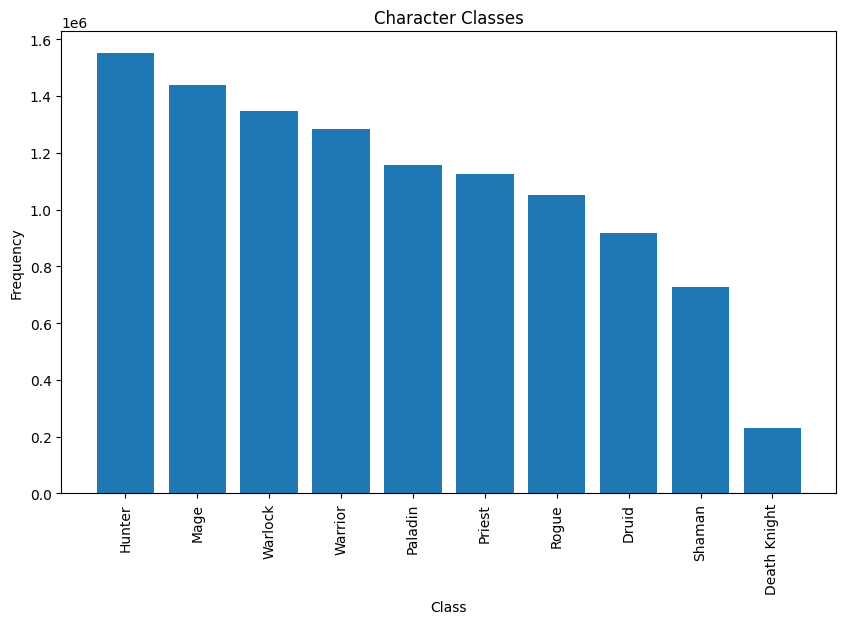

In [10]:
#Frequencies of the Each Class
char_counts=data['charclass'].value_counts()
char_counts
plt.figure(figsize=(10, 6))
plt.bar(char_counts.index, char_counts.values)
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Character Classes')
plt.xticks(rotation=90)
plt.show()

c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 31478 (\N{CJK UNIFIED IDEOGRAPH-7AF6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 25216 (\N{CJK UNIFIED IDEOGRAPH-6280}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 22580 (\N{CJK UNIFIED IDEOGRAPH-5834}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


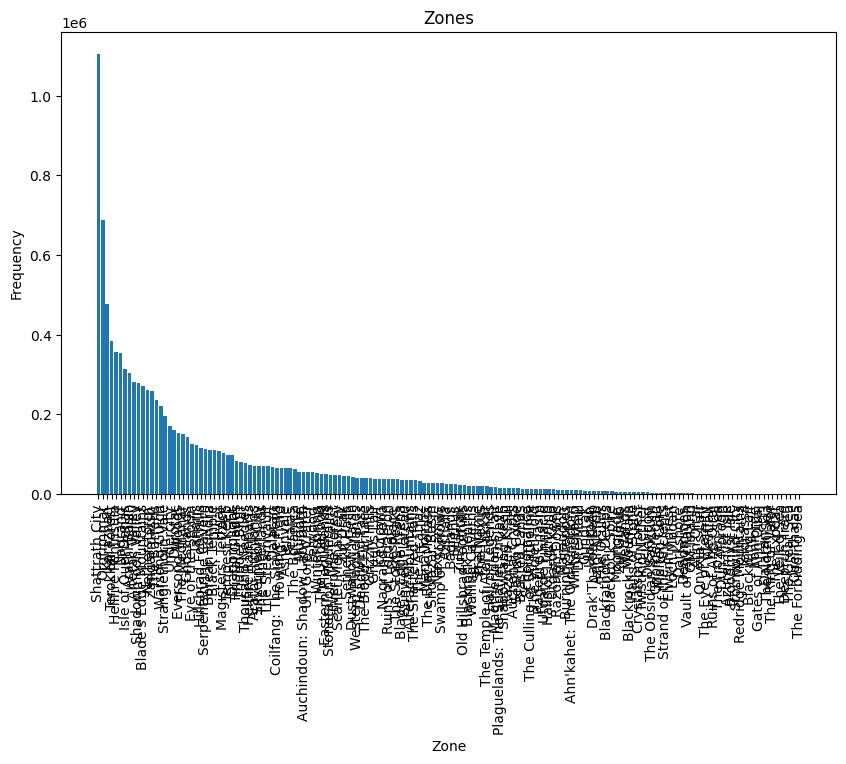

In [11]:
#Frequencies of the Each Zone
char_counts=data['zone'].value_counts()
char_counts
plt.figure(figsize=(10, 6))
plt.bar(char_counts.index, char_counts.values)
plt.xlabel('Zone')
plt.ylabel('Frequency')
plt.title('Zones')
plt.xticks(rotation=90)
plt.show()

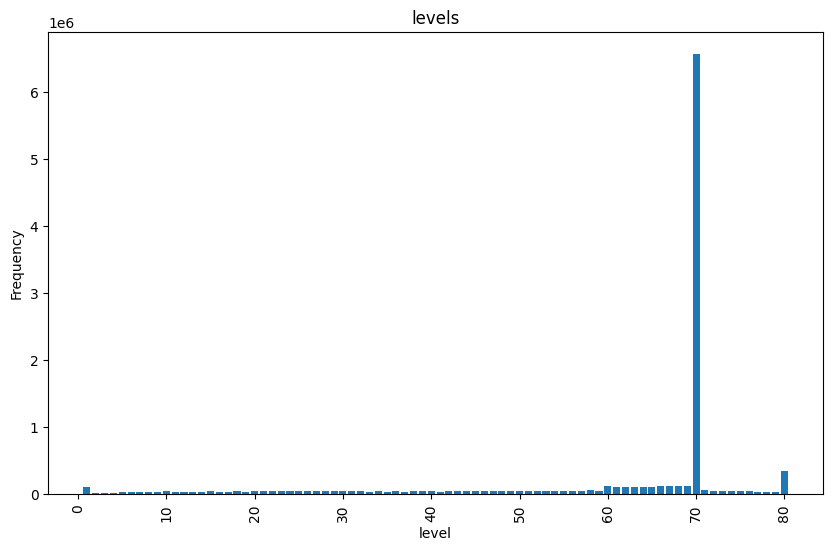

In [12]:
#Frequencies of the Each Level
char_counts=data['level'].value_counts()
char_counts
plt.figure(figsize=(10, 6))
plt.bar(char_counts.index, char_counts.values)
plt.xlabel('level')
plt.ylabel('Frequency')
plt.title('levels')
plt.xticks(rotation=90)
plt.show()

In [13]:
nx.is_connected(G)

True

In [14]:
G.add_nodes_from(set(data.charclass), bipartite = 0)
G.add_nodes_from(set(data.zone), bipartite = 1)

In [15]:
nx.is_bipartite(G)

True

c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 31478 (\N{CJK UNIFIED IDEOGRAPH-7AF6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 25216 (\N{CJK UNIFIED IDEOGRAPH-6280}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 22580 (\N{CJK UNIFIED IDEOGRAPH-5834}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


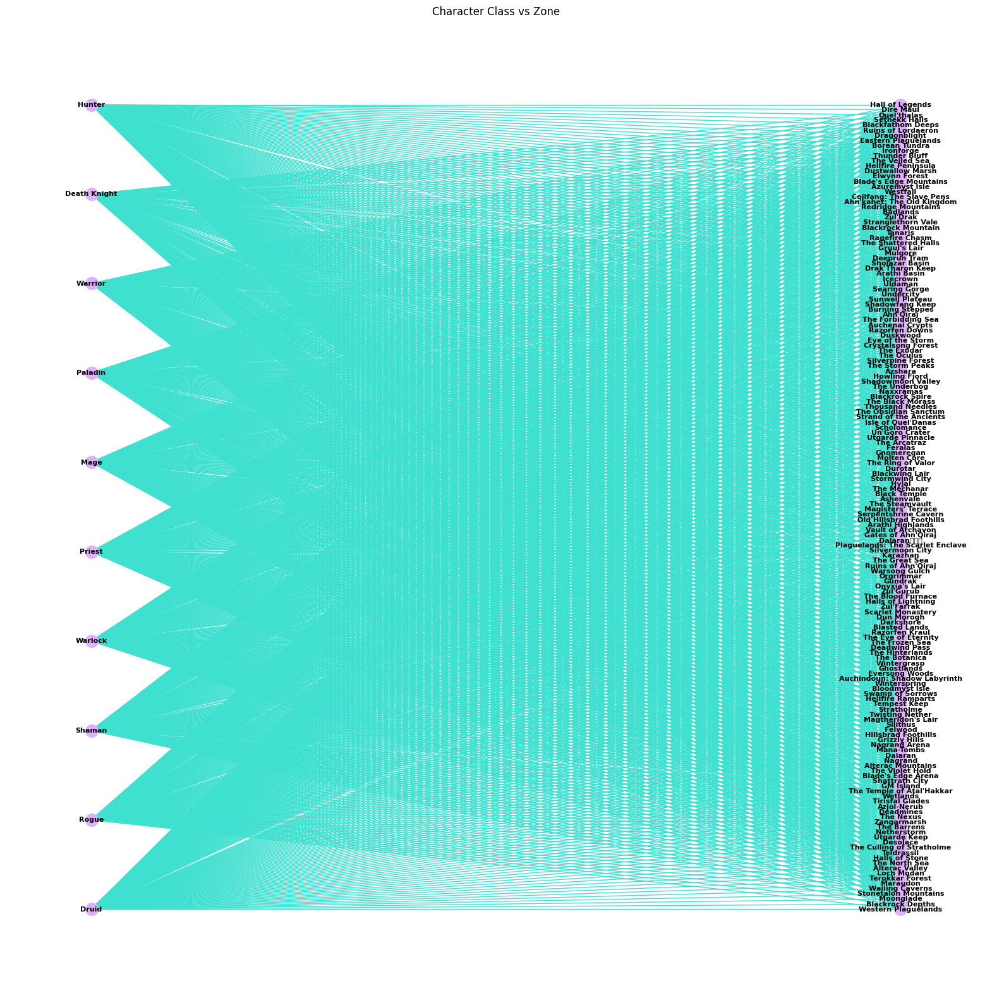

In [16]:
raceleft = data['charclass']
pos = nx.bipartite_layout(G, raceleft)
plt.figure(figsize=(20, 20))
nx.draw_networkx(G, pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Character Class vs Zone")
plt.axis('off')
plt.show()

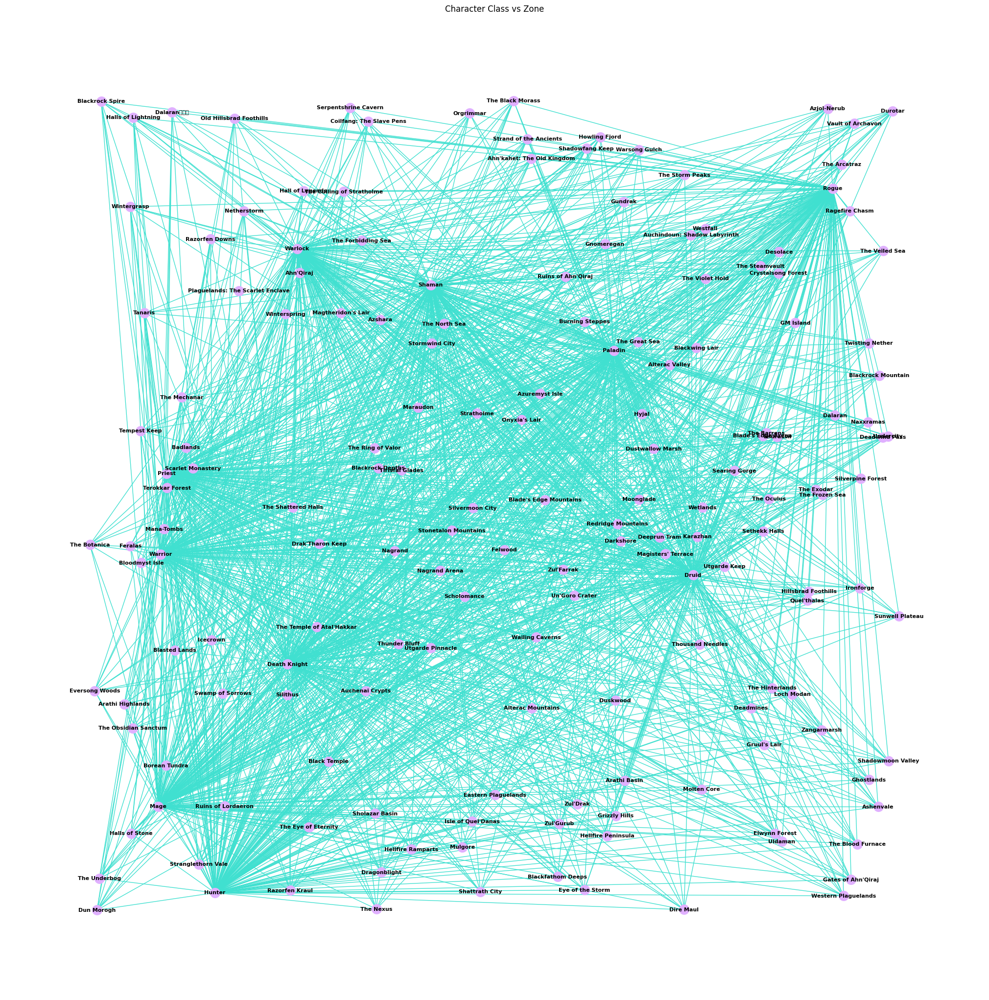

In [17]:
pos = nx.random_layout(G)
plt.figure(figsize=(20, 20))
nx.draw(G, pos=pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Character Class vs Zone")
plt.axis('off')
plt.show()

In [18]:
charclass, zone = bipartite.sets(G)
print("charclass density =",bipartite.density(G, charclass))
print("charclass density =",bipartite.density(G, zone))

charclass density = 0.9753164556962025
charclass density = 0.9753164556962025


## Island Method to Bipartite Network

In [19]:
def trim_edges(g, weight=1):
    g2=nx.Graph()
    for f, to, edata in g.edges(data=True):
        if edata['weight'] > weight:
            g2.add_edge(f, to, weight = edata)
    return g2

In [20]:
def island_method(g, iterations=5):
    weights = [int(edata['weight']) for f, to, edata in g.edges(data=True)]  # Convert weights to integers
    mn = min(weights)
    mx = max(weights)
    step = (mx - mn) // iterations
    return [[threshold, trim_edges(g, threshold)] for threshold in range(mn, mx, step)]


In [21]:
cc=list([G.subgraph(n) for n in nx.connected_components(G)])[0]
islands=island_method(cc)
for i in islands:
    # print the threshold level, size of the graph, and number of connected components
    print(i[0], len(list(i[1])), len(list(G.subgraph(n) for n in nx.connected_components(i[1])))) 

1 168 1
16 168 1
31 168 1
46 168 1
61 165 1
76 152 1


# Inference of Character Class on player zone location
`[threshold, size, num_components]`
- threshold refers to the threshold value used in the island method.
- size indicates the number of edges remaining in the graph after applying the threshold.
- num_components represents the number of connected components in the graph after applying the threshold.

Thus regardless of what threshold value I chose the graph will remain connected with the same number of edges and a single connected component. This implies that the game world is designed to allow players from different character classes to explore and progress through different zones regardless of their level. It suggests an open or non-restricted gameplay experience where players have freedom in choosing their character class and can freely explore different zones without being limited by their level or class.


# Testign a new Bipartate
## Players vs Guilds 
edge=levels


In [22]:
G2 = nx.Graph()
edges = data[['char', 'guild', 'level']]
edgelist = np.array(edges)
G2.add_weighted_edges_from(edgelist)

In [23]:
G2.add_nodes_from(set(data.char), bipartite = 0)
G2.add_nodes_from(set(data.guild), bipartite = 1)

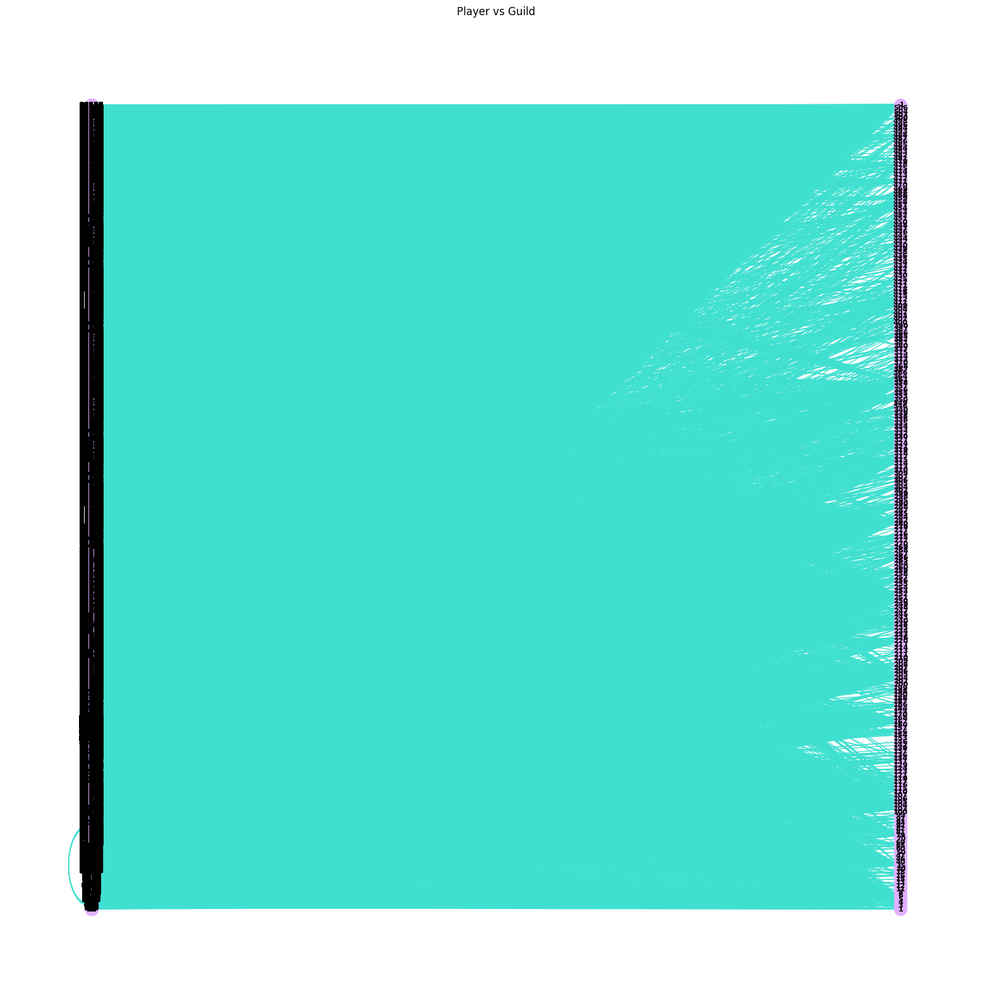

In [27]:
raceleft = data['char']
pos = nx.bipartite_layout(G2, raceleft)
plt.figure(figsize=(20, 20))
nx.draw_networkx(G2, pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Player vs Guild")
plt.axis('off')
plt.show()

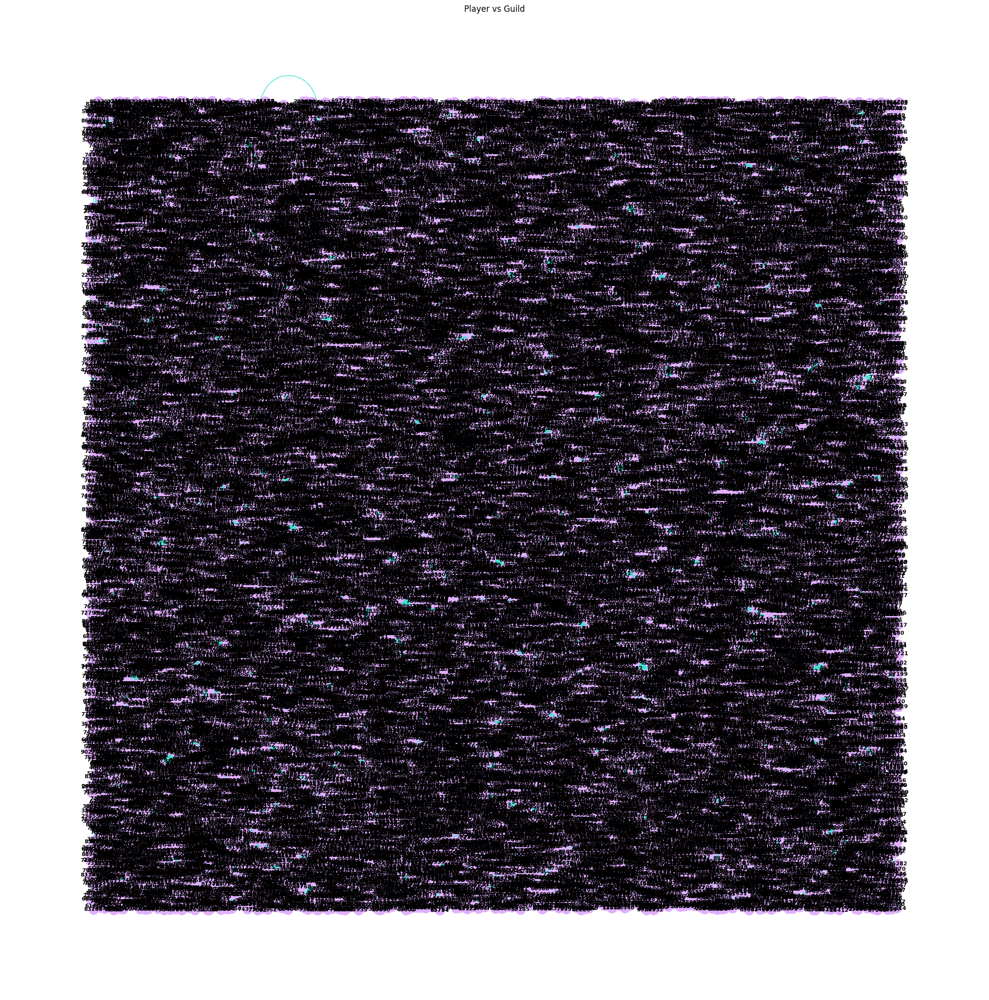

In [25]:
pos = nx.random_layout(G2)
plt.figure(figsize=(20, 20))
nx.draw(G2, pos=pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Player vs Guild")
plt.axis('off')
plt.show()

In [26]:
char, guild = bipartite.sets(G2)
print("charclass density =",bipartite.density(G2, char))
print("charclass density =",bipartite.density(G2, guild))

AmbiguousSolution: Disconnected graph: Ambiguous solution for bipartite sets.

In [28]:
cc=list([G2.subgraph(n) for n in nx.connected_components(G2)])[0]
islands=island_method(cc)
for i in islands:
    # print the threshold level, size of the graph, and number of connected components
    print(i[0], len(list(i[1])), len(list(G2.subgraph(n) for n in nx.connected_components(i[1])))) 

1 25858 2
16 12791 7
31 9628 6
46 8225 6
61 5704 6
76 1132 18


# Inference of Players Joining Guilds based on experience level
`[threshold, size, num_components]`
- threshold refers to the threshold value used in the island method.
- size indicates the number of edges remaining in the graph after applying the threshold.
- num_components represents the number of connected components in the graph after applying the threshold.

These results suggest that the player community within the game can be divided into several distinct groups or clusters based on their guild affiliations and levels. Each connected component represents a subset of players who have a direct or indirect connection with each other through guilds and similar levels of experience.Overall, this analysis helps identify and understand the structure of the player community in terms of guild associations and level similarities, providing insights into the social dynamics and groupings within the game.



# Guild vs zone 
based on players

In [31]:
G3 = nx.Graph()
edges = data[['guild', 'zone', 'char']]
edgelist = np.array(edges)
G3.add_weighted_edges_from(edgelist)

G3.add_nodes_from(set(data.guild), bipartite = 0)
G3.add_nodes_from(set(data.zone), bipartite = 1)



In [32]:
guild, zone = bipartite.sets(G3)
print("charclass density =",bipartite.density(G3, guild))
print("charclass density =",bipartite.density(G3, zone))

charclass density = 0.28131404460518383
charclass density = 0.28131404460518383


c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 31478 (\N{CJK UNIFIED IDEOGRAPH-7AF6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 25216 (\N{CJK UNIFIED IDEOGRAPH-6280}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\keeno\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 22580 (\N{CJK UNIFIED IDEOGRAPH-5834}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


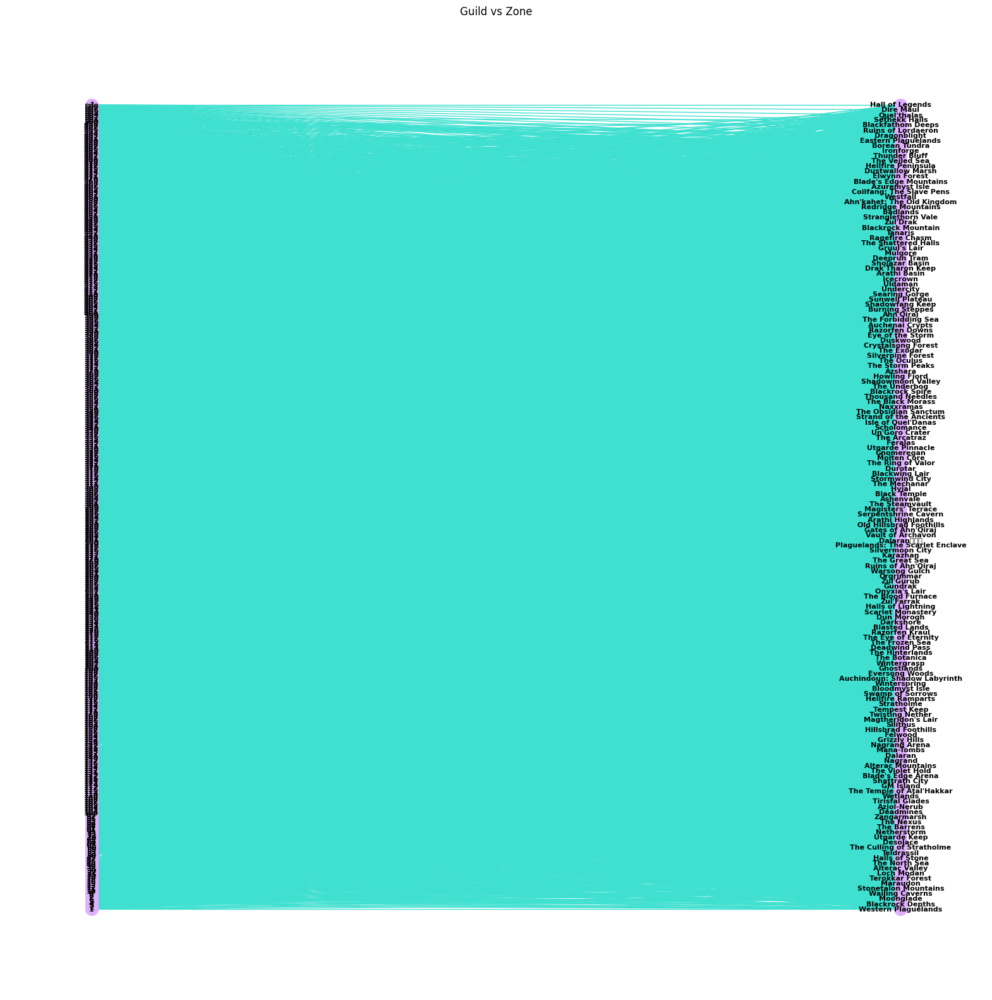

In [33]:
raceleft = data['guild']
pos = nx.bipartite_layout(G3, raceleft)
plt.figure(figsize=(20, 20))
nx.draw_networkx(G3, pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Guild vs Zone")
plt.axis('off')
plt.show()

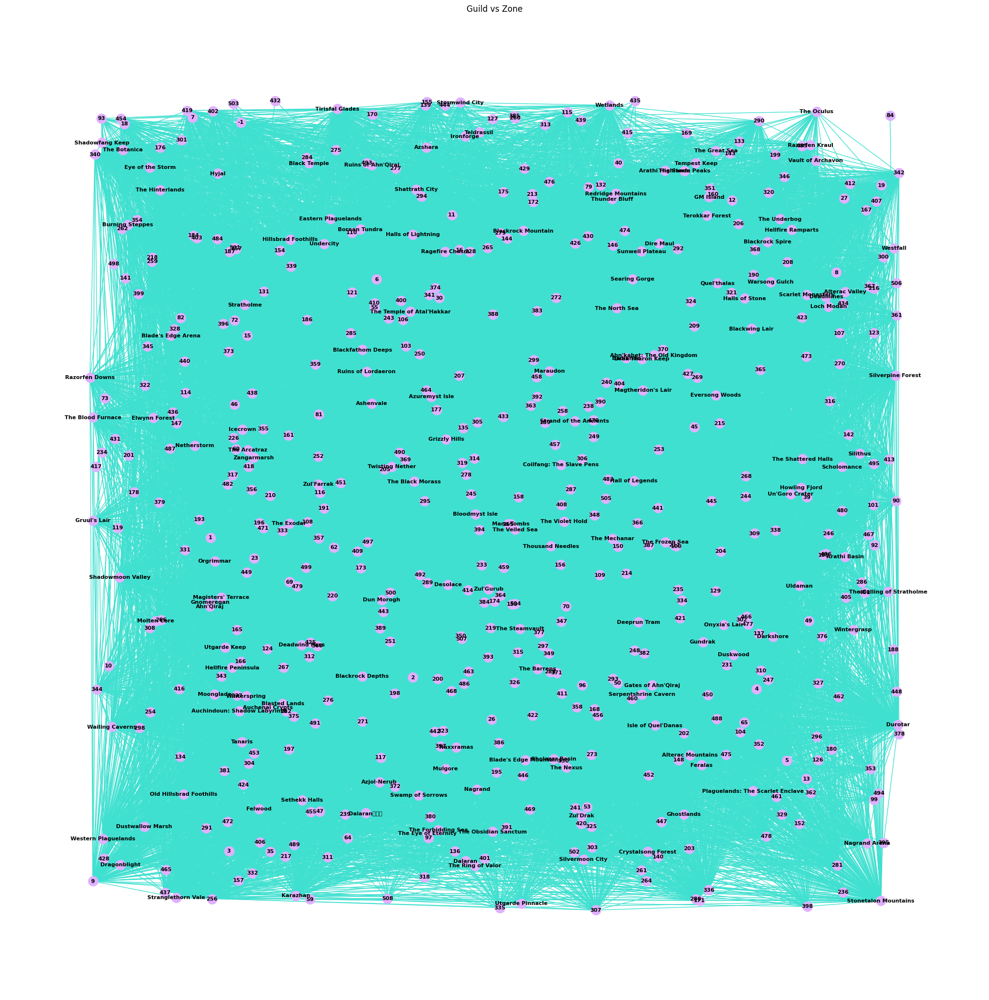

In [34]:
pos = nx.random_layout(G3)
plt.figure(figsize=(20, 20))
nx.draw(G3, pos=pos, with_labels=True, node_size=200, node_color='#E0B0FF', font_size=8, font_weight='bold', edge_color='#40E0D0')
plt.title("Guild vs Zone")
plt.axis('off')
plt.show()

In [35]:
cc=list([G3.subgraph(n) for n in nx.connected_components(G3)])[0]
islands=island_method(cc)
for i in islands:
    # print the threshold level, size of the graph, and number of connected components
    print(i[0], len(list(i[1])), len(list(G3.subgraph(n) for n in nx.connected_components(i[1])))) 

7 578 1
18119 539 1
36231 498 1
54343 464 1
72455 350 1
90567 2 1


# Inference of Guild hotzones based on players
`[threshold, size, num_components]`
- threshold refers to the threshold value used in the island method.
- size indicates the number of edges remaining in the graph after applying the threshold.
- num_components represents the number of connected components in the graph after applying the threshold.

This result demonstrates to us that guilds may tend to aggregate in one area in close prozimity with one another. It could imply the existence of guilds that focus on particular gameplay aspects or strategies associated with specific zones. Game developers could utilize this info for game balancing and further understanding the social dynamics of their game and how their users go about their gaming experience.